In [1]:
import numpy as np
import pandas as pd
import artm
import matplotlib.pyplot as plt
%matplotlib inline
import gc

# Data Load

In [2]:
%%time
data = pd.read_csv('../data/news_lenta.csv')

CPU times: user 14.8 s, sys: 782 ms, total: 15.6 s
Wall time: 15.6 s


In [5]:
data.head(10)

,tags,text,title,topic,url
0,Общество,Миллиардер Илон Маск в резкой форме ответил бр...,Илон Маск назвал педофилом спасавшего детей из...,Мир,https://lenta.ru/news/2018/07/16/su57/
1,Рынки,США и их западные союзники рассматривают возмо...,США задумались о распечатывании нефтяного резерва,Экономика,https://lenta.ru/news/2018/07/16/foes/
2,Преступность,Празднование победы сборной Франции на чемпион...,Празднование победы на ЧМ во Франции закончило...,Мир,https://lenta.ru/news/2018/07/15/fra_bezumie/
3,Политика,География использования лимузинов проекта «Кор...,Песков рассказал о планах на президентские лим...,Россия,https://lenta.ru/news/2018/07/16/delo_shyut/
4,Музыка,Американская поп-певица Бритни Спирс случайно ...,Грудь Бритни Спирс вновь выскочила из лифчика ...,Культура,https://lenta.ru/news/2018/07/16/pedomusk/
5,Футбол,Местность возле стадиона чемпионата мира 2018 ...,Стадион чемпионата мира размыло дождем,Спорт,https://lenta.ru/news/2018/07/16/mundial_is_over/
6,Футбол,Футбольный клуб «Монако» сделал официальное пр...,«Монако» сделал официальное предложение ЦСКА п...,Спорт,https://lenta.ru/news/2018/07/16/uchitel_nasil...
7,Полиция и спецслужбы,Сотрудники Федеральной службы охраны (ФСО) за...,Попытка вернуть укатившийся мяч у Кремлевской ...,Силовые структуры,https://lenta.ru/news/2018/07/16/gru/
8,Футбол,"В отношении участников панк-группы Pussy Riot,...",Полиция возбудила дела против выбежавших на по...,Спорт,https://lenta.ru/news/2018/07/16/taki_on/
9,Политика,Турция благодарна России за поддержку правител...,Турция поблагодарила Россию за поддержку во вр...,Мир,https://lenta.ru/news/2018/07/16/legalize/


In [4]:
data.tail()

,tags,text,title,topic,url
699741,Все,Бывший шеф Службы безопасности президента Але...,Леворадикалы создают предвыборный блок,Россия,https://lenta.ru/news/1999/08/31/cholera/
699742,Все,Россия крайне негативно оценивает судебный про...,Литва засудила участников переворота 91 года,Мир,https://lenta.ru/news/1999/08/31/limonov/
699743,Все,На состоявшейся сегодня в Москве пресс-конфере...,Коржаков готов рассказать Генпрокуратуре про ф...,Россия,https://lenta.ru/news/1999/08/31/polit_blok/
699744,Все,"подземный толчок силой 5,2 балла На северо-зап...",Еще одно землетрясение в Турции: один человек ...,Мир,https://lenta.ru/news/1999/08/31/korzhakov/
699745,Все,"На юге Киргизии, а именно в Баткенском и Чон-А...",Киргизия ведет бои на границах с Таджикистаном...,Мир,https://lenta.ru/news/1999/08/31/karachaevo/


Видно, что ссылки не совпадают со статьями, но примерно рядом с ними.

# Preprocess
## Get dates

In [6]:
import re

In [7]:
r = re.compile('(\d{4})/(\d{2})/(\d{2})')
r.findall('https://lenta.ru/news/1999/08/31/cholera/')

[('1999', '08', '31')]

In [8]:
data['date_raw'] = data['url'].apply(r.findall)

In [9]:
data.head()

,tags,text,title,topic,url,date_raw
0,Общество,Миллиардер Илон Маск в резкой форме ответил бр...,Илон Маск назвал педофилом спасавшего детей из...,Мир,https://lenta.ru/news/2018/07/16/su57/,"[(2018, 07, 16)]"
1,Рынки,США и их западные союзники рассматривают возмо...,США задумались о распечатывании нефтяного резерва,Экономика,https://lenta.ru/news/2018/07/16/foes/,"[(2018, 07, 16)]"
2,Преступность,Празднование победы сборной Франции на чемпион...,Празднование победы на ЧМ во Франции закончило...,Мир,https://lenta.ru/news/2018/07/15/fra_bezumie/,"[(2018, 07, 15)]"
3,Политика,География использования лимузинов проекта «Кор...,Песков рассказал о планах на президентские лим...,Россия,https://lenta.ru/news/2018/07/16/delo_shyut/,"[(2018, 07, 16)]"
4,Музыка,Американская поп-певица Бритни Спирс случайно ...,Грудь Бритни Спирс вновь выскочила из лифчика ...,Культура,https://lenta.ru/news/2018/07/16/pedomusk/,"[(2018, 07, 16)]"


In [10]:
data.shape

(699746, 6)

Точнее, чем за месяц нам не нужно.

In [12]:
data['year'] = data['date_raw'].apply(lambda x: int(x[0][0]))
data['month'] = data['date_raw'].apply(lambda x: int(x[0][1]))

In [13]:
data.head()

,tags,text,title,topic,url,date_raw,year,month
0,Общество,Миллиардер Илон Маск в резкой форме ответил бр...,Илон Маск назвал педофилом спасавшего детей из...,Мир,https://lenta.ru/news/2018/07/16/su57/,"[(2018, 07, 16)]",2018,7
1,Рынки,США и их западные союзники рассматривают возмо...,США задумались о распечатывании нефтяного резерва,Экономика,https://lenta.ru/news/2018/07/16/foes/,"[(2018, 07, 16)]",2018,7
2,Преступность,Празднование победы сборной Франции на чемпион...,Празднование победы на ЧМ во Франции закончило...,Мир,https://lenta.ru/news/2018/07/15/fra_bezumie/,"[(2018, 07, 15)]",2018,7
3,Политика,География использования лимузинов проекта «Кор...,Песков рассказал о планах на президентские лим...,Россия,https://lenta.ru/news/2018/07/16/delo_shyut/,"[(2018, 07, 16)]",2018,7
4,Музыка,Американская поп-певица Бритни Спирс случайно ...,Грудь Бритни Спирс вновь выскочила из лифчика ...,Культура,https://lenta.ru/news/2018/07/16/pedomusk/,"[(2018, 07, 16)]",2018,7


## Normalize

In [14]:
import pymorphy2

In [15]:
retoken = re.compile(r'[\'\w]+')
cache = {}
morph = pymorphy2.MorphAnalyzer()

def norm(word):
    '''normalize with caching'''
    if word in cache:
        return cache[word]
    nw = cache[word] = morph.parse(word)[0].normal_form
    return str(nw)

def tokenize_normalize(text):
    '''strip text to words then normalize it'''
    text = retoken.findall(text.lower())
    text = [norm(x) for x in text]
    return text

TODO: Выбрать лучший лемматизатор для нашей задачи.

In [16]:
%%time
data['lemmatized_text'] = data['text'].apply(tokenize_normalize)

CPU times: user 2min 11s, sys: 656 ms, total: 2min 12s
Wall time: 2min 12s


In [17]:
data.head()

,tags,text,title,topic,url,date_raw,year,month,lemmatized_text
0,Общество,Миллиардер Илон Маск в резкой форме ответил бр...,Илон Маск назвал педофилом спасавшего детей из...,Мир,https://lenta.ru/news/2018/07/16/su57/,"[(2018, 07, 16)]",2018,7,"[миллиардер, илона, маск, в, резка, форма, отв..."
1,Рынки,США и их западные союзники рассматривают возмо...,США задумались о распечатывании нефтяного резерва,Экономика,https://lenta.ru/news/2018/07/16/foes/,"[(2018, 07, 16)]",2018,7,"[сша, и, они, западный, союзник, рассматривать..."
2,Преступность,Празднование победы сборной Франции на чемпион...,Празднование победы на ЧМ во Франции закончило...,Мир,https://lenta.ru/news/2018/07/15/fra_bezumie/,"[(2018, 07, 15)]",2018,7,"[празднование, победа, сборный, франция, на, ч..."
3,Политика,География использования лимузинов проекта «Кор...,Песков рассказал о планах на президентские лим...,Россия,https://lenta.ru/news/2018/07/16/delo_shyut/,"[(2018, 07, 16)]",2018,7,"[география, использование, лимузин, проект, ко..."
4,Музыка,Американская поп-певица Бритни Спирс случайно ...,Грудь Бритни Спирс вновь выскочила из лифчика ...,Культура,https://lenta.ru/news/2018/07/16/pedomusk/,"[(2018, 07, 16)]",2018,7,"[американский, поп, певица, бритни, спирс, слу..."


In [18]:
# В будущем будем делать join матрицы тем с документами
data['docID'] = list(range(data.shape[0]))

In [19]:
data.head()

,tags,text,title,topic,url,date_raw,year,month,lemmatized_text,docID
0,Общество,Миллиардер Илон Маск в резкой форме ответил бр...,Илон Маск назвал педофилом спасавшего детей из...,Мир,https://lenta.ru/news/2018/07/16/su57/,"[(2018, 07, 16)]",2018,7,"[миллиардер, илона, маск, в, резка, форма, отв...",0
1,Рынки,США и их западные союзники рассматривают возмо...,США задумались о распечатывании нефтяного резерва,Экономика,https://lenta.ru/news/2018/07/16/foes/,"[(2018, 07, 16)]",2018,7,"[сша, и, они, западный, союзник, рассматривать...",1
2,Преступность,Празднование победы сборной Франции на чемпион...,Празднование победы на ЧМ во Франции закончило...,Мир,https://lenta.ru/news/2018/07/15/fra_bezumie/,"[(2018, 07, 15)]",2018,7,"[празднование, победа, сборный, франция, на, ч...",2
3,Политика,География использования лимузинов проекта «Кор...,Песков рассказал о планах на президентские лим...,Россия,https://lenta.ru/news/2018/07/16/delo_shyut/,"[(2018, 07, 16)]",2018,7,"[география, использование, лимузин, проект, ко...",3
4,Музыка,Американская поп-певица Бритни Спирс случайно ...,Грудь Бритни Спирс вновь выскочила из лифчика ...,Культура,https://lenta.ru/news/2018/07/16/pedomusk/,"[(2018, 07, 16)]",2018,7,"[американский, поп, певица, бритни, спирс, слу...",4


# BigARTM

## Prepare for BigARTM input

In [21]:
vwpath = 'data/lenta.vw'

In [20]:
%%time
with open(vwpath, 'w') as fp:
    for text, did in data[['lemmatized_text', 'docID']].values:
        fp.write('{} |default {}\n'.format(did, ' '.join(text)))

CPU times: user 7.5 s, sys: 792 ms, total: 8.3 s
Wall time: 8.3 s


Записали исходный файл для bigARTM, дальше нам не нужен исходный датафрейм в памяти

In [45]:
data.to_csv('../data/processed_lenta.csv.gz', compression='gzip', index=False)

In [47]:
# Будем джоинить даты по docID с полученной матрицей тем
id_date = data[['docID', 'year', 'month']].copy()
del data
gc.collect()

30550

Собираем батчи и собираем словарь

In [22]:
batches_path = 'data/batches'

In [23]:
%%time
batch_vectorizer = artm.BatchVectorizer(data_path=vwpath,
                                        data_format='vowpal_wabbit',
                                        target_folder=batches_path)

CPU times: user 6min 55s, sys: 1.62 s, total: 6min 57s
Wall time: 1min 44s


In [24]:
%%time
dictionary = artm.Dictionary()
dictionary.gather(data_path=batches_path)

CPU times: user 45.1 s, sys: 244 ms, total: 45.4 s
Wall time: 45.4 s


## Init model and fit it

TODO: отобрать число тем.  
TODO: фильтровать словарь по частоте (bigARTM имеет для этого встроенный функционал)  
TODO: покрутить регуляризаторы, попробовать иерархическую модель   
  
Я беру большое число, рассчитывая на то, что актуальными в каждый отдельный момент будут не очень много тем, и при этом можно будет разделить темы отдельных событий.

In [25]:
NUM_TOPICS = 100
model = artm.ARTM(num_topics=NUM_TOPICS, dictionary=dictionary)
model.scores.add(artm.PerplexityScore(name='perplexity_score',
                                      dictionary=dictionary))

In [26]:
%%time
model.fit_offline(batch_vectorizer=batch_vectorizer, num_collection_passes=10)

CPU times: user 1h 3min 37s, sys: 11.3 s, total: 1h 3min 49s
Wall time: 9min 58s


In [ ]:
# В следующий раз можно будет подгрузить готовые батчи, словарь и обученную модель
model.save('model.bin')

## Get topics-words matrix

In [27]:
phi = model.get_phi()

In [28]:
phi.head()

,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,...,topic_90,topic_91,topic_92,topic_93,topic_94,topic_95,topic_96,topic_97,topic_98,topic_99
райсингер,0.0,0.0,0.000000e+00,0.0,0.0,3.331493e-08,0.0,0.0,0.000000e+00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0
филлиз,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,1.127729e-09,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0
soloist,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0
о'хортен,0.0,0.0,5.223155e-10,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0
албасовый,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.587991e-13,0.0


In [29]:
phi['word'] = phi.index

### Top words in topics

In [31]:
for col in phi.columns:
    if col != 'word':
        print(col)
        print(phi[[col, 'word']].sort_values(by=col, ascending=False)['word'].values[:20])

topic_0
['в' 'не' 'на' 'по' 'что' 'быть' 'и' 'он' 'это' 'который' 'тот' 'зарплата'
 'для' 'слово' 'как' 'о' 'месторождение' 'бизнес' 'работник' 'от']
topic_1
['в' 'украина' 'украинский' 'на' 'и' 'киев' 'турция' 'что' 'это'
 'турецкий' '2014' 'с' 'народный' 'донбасс' 'донецкий' 'быть' 'россия'
 'год' 'заявить' 'территория']
topic_2
['в' 'он' 'что' 'быть' 'который' 'и' 'с' 'снять' 'журналист' 'бывший'
 'генерал' 'как' 'свой' 'снятой' 'по' 'березовский' 'брат' 'слово'
 'утверждать' 'человек']
topic_3
['в' 'год' 'и' 'на' 'он' 'с' 'семья' 'она' 'быть' 'церковь' 'отец' 'дочь'
 'сын' 'жена' 'свой' 'который' 'ii' 'супруг' 'после' 'храм']
topic_4
['министр' 'правительство' 'и' 'россия' 'премьер' 'с' 'в' 'что'
 'экономический' 'на' 'это' 'заявить' 'медведев' 'санкция' 'год'
 'развитие' 'по' 'президент' 'он' 'российский']
topic_5
['в' 'издание' 'газета' 'и' 'год' 'по' 'книга' 'с' 'студент' 'университет'
 'что' 'о' 'алкоголь' 'быть' 'как' 'это' 'напиток' 'журнал' 'а' 'список']
topic_6
['мы' 'и' 'в

['в' 'боевик' 'по' 'быть' 'погибнуть' 'военный' 'район' 'что' 'операция'
 'город' 'группировка' 'результат' 'человек' 'убитый' 'террорист' 'из'
 'теракт' 'который' 'ранение' 'уничтожить']
topic_51
['на' 'доллар' 'рубль' 'нефть' 'до' 'курс' 'цена' 'за' 'евро' 'стоимость'
 'к' 'по' 'и' 'с' 'баррель' 'валюта' 'уровень' 'стоить' '1' 'что']
topic_52
['на' 'и' 'станция' 'поезд' 'быть' 'из' 'что' 'он' 'путь'
 'железнодорожный' 'движение' 'парк' 'который' 'с' 'за' 'к' 'час' 'мкс'
 'время' 'как']
topic_53
['в' 'фонд' 'и' 'поддержка' 'образование' 'который' 'человек' 'для' 'с'
 'что' 'год' 'население' 'тот' 'ющенко' 'тысяча' 'президент' 'эстония'
 'быть' 'массовый' 'на']
topic_54
['6' 'в' 'с' 'на' 'и' 'турнир' '4' 'круг' '7' 'один' 'из' 'финал' 'два'
 'мария' '3' 'рейтинг' 'россиянка' 'она' 'австралия' 'который']
topic_55
['в' 'доллар' 'миллион' 'год' 'компания' 'на' 'тысяча' 'и' 'продать' 'за'
 'с' 'продажа' 'фунт' 'мир' 'который' 'крупный' 'аукцион' 'сша' 'самый'
 'американский']
topic_56
['чт

In [ ]:
# Дальше нам не нужно хранить эту матрицу в памяти
del phi
gc.collect()

## Get topics-docs matrix
### Sparse (memory effective)

In [33]:
theta = model.transform_sparse(batch_vectorizer=batch_vectorizer, eps=0.001)

In [34]:
theta[0].shape

(100, 699746)

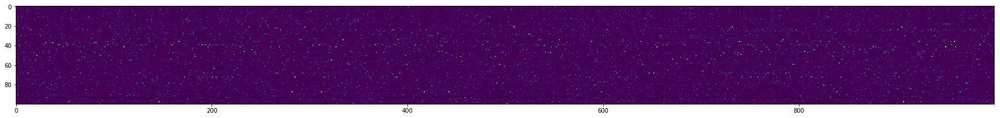

In [44]:
# Можно посмотреть кусок матрицы
plt.figure(figsize=(30, 10))
plt.imshow(theta[0][:, 2000:3000].toarray());

### Dense theta matrix

In [49]:
%%time
theta = model.transform(batch_vectorizer=batch_vectorizer)

CPU times: user 5min 16s, sys: 857 ms, total: 5min 17s
Wall time: 45.2 s


In [50]:
theta.head()

,384000,384001,384002,384003,384004,384005,384006,384007,384008,384009,...,197990,197991,197992,197993,197994,197995,197996,197997,197998,197999
topic_0,0.039692,0.019296,0.000026,0.000314,0.000047,0.000519,0.032875,0.000152,0.000240,0.000003,...,1.518948e-02,0.000023,7.169294e-09,0.000001,3.638897e-06,3.873766e-08,0.003943,0.005949,0.000216,0.001394
topic_1,0.000053,0.000039,0.000027,0.000082,0.000058,0.000908,0.000031,0.000140,0.000005,0.000851,...,5.046047e-06,0.008506,1.017044e-08,0.000134,1.486166e-06,2.077899e-02,0.000234,0.027557,0.075081,0.174693
topic_2,0.000071,0.020640,0.000460,0.008623,0.003391,0.018036,0.000065,0.000085,0.000354,0.000007,...,1.626919e-05,0.000024,9.352926e-09,0.015415,6.317121e-07,2.097279e-06,0.001102,0.028532,0.013789,0.013019
topic_3,0.000808,0.000018,0.000029,0.002624,0.000050,0.000021,0.019658,0.000005,0.016612,0.113029,...,1.578800e-04,0.000007,1.206594e-08,0.007199,1.863073e-09,7.353866e-08,0.000218,0.000005,0.000014,0.000001
topic_4,0.022978,0.000534,0.000004,0.003875,0.000029,0.000036,0.021136,0.000018,0.000466,0.003238,...,4.699577e-07,0.000103,9.161565e-08,0.048637,3.974056e-03,2.962333e-08,0.175135,0.206732,0.078407,0.003560


In [51]:
theta = theta.T

In [52]:
theta.head()

,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,...,topic_90,topic_91,topic_92,topic_93,topic_94,topic_95,topic_96,topic_97,topic_98,topic_99
384000,0.039692,0.000053,0.000071,0.000808,0.022978,0.000006,0.000043,0.010465,0.007876,9.210364e-06,...,0.035193,0.011052,0.003544,0.000105,0.000039,0.001201,1.114271e-03,0.009062,0.000015,0.000107
384001,0.019296,0.000039,0.020640,0.000018,0.000534,0.000056,0.008075,0.000036,0.000097,6.918709e-05,...,0.000571,0.000032,0.009891,0.000261,0.014298,0.004082,6.281699e-04,0.012977,0.039663,0.018076
384002,0.000026,0.000027,0.000460,0.000029,0.000004,0.000004,0.000187,0.000001,0.001560,2.583719e-07,...,0.000105,0.007339,0.002014,0.000011,0.092530,0.000171,5.925947e-07,0.000002,0.000091,0.000005
384003,0.000314,0.000082,0.008623,0.002624,0.003875,0.043647,0.002685,0.000029,0.000241,6.743435e-05,...,0.000304,0.003107,0.036898,0.000011,0.003379,0.000208,5.553777e-04,0.000299,0.000369,0.000145
384004,0.000047,0.000058,0.003391,0.000050,0.000029,0.000399,0.000040,0.024735,0.087884,2.563455e-04,...,0.000974,0.000425,0.001450,0.000003,0.000075,0.000094,6.314101e-04,0.000289,0.048809,0.000158


In [53]:
id_date.head()

,docID,year,month
0,0,2018,7
1,1,2018,7
2,2,2018,7
3,3,2018,7
4,4,2018,7


# DataViz
## Prepare Theta matrix

In [55]:
%%time
# прилепим даты к темам
joined = id_date.join(theta)

CPU times: user 721 ms, sys: 152 ms, total: 873 ms
Wall time: 813 ms


In [56]:
joined.head()

,docID,year,month,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,...,topic_90,topic_91,topic_92,topic_93,topic_94,topic_95,topic_96,topic_97,topic_98,topic_99
0,0,2018,7,0.000176,0.000028,0.002792,2.343415e-05,0.000030,0.000002,6.725798e-04,...,0.047867,0.000005,0.004111,0.000236,4.630344e-05,0.000005,0.000094,0.045626,0.014278,9.722785e-06
1,1,2018,7,0.016739,0.000023,0.000016,2.947070e-07,0.052385,0.002147,2.933799e-04,...,0.000016,0.000022,0.005478,0.000022,4.891411e-07,0.072606,0.002038,0.000013,0.000087,6.815334e-04
2,2,2018,7,0.000002,0.000002,0.000015,1.029987e-05,0.000005,0.014796,9.647841e-07,...,0.061657,0.000010,0.004300,0.016689,1.957378e-04,0.000525,0.000002,0.000004,0.007360,4.077344e-07
3,3,2018,7,0.000612,0.000104,0.000090,4.177478e-06,0.009053,0.003440,1.285277e-04,...,0.017852,0.000036,0.000064,0.000014,1.990578e-07,0.000267,0.142129,0.000110,0.006669,8.237213e-05
4,4,2018,7,0.000005,0.000210,0.000063,1.069001e-05,0.000004,0.004339,6.405924e-06,...,0.000945,0.000350,0.000041,0.000031,2.236487e-06,0.000188,0.000002,0.000013,0.000018,5.691160e-03


In [58]:
topics = ['topic_{}'.format(i) for i in range(NUM_TOPICS)]
gb = joined.groupby(['year', 'month'])[topics].sum()

In [59]:
gb.head()

topic_0   topic_1   topic_2   topic_3    topic_4   topic_5  \
year month                                                                
1914 9      0.107951  0.017938  0.000310  0.007960   0.181999  0.002022   
1999 8      0.027899  0.114444  0.222899  0.014066   0.152749  0.028778   
     9      5.547353  1.695648  5.228696  3.929114  13.084373  2.478218   
     10     8.798816  1.945067  4.739001  3.012833  15.557234  3.660573   
     11     9.446501  3.461564  5.940708  4.918396  20.917377  5.322709   

              topic_6    topic_7    topic_8   topic_9    ...      topic_90  \
year month                                               ...                 
1914 9       0.033708   0.038925   0.000856  0.489748    ...      0.000365   
1999 8       0.402707   1.135887   0.307783  0.440471    ...      0.059688   
     9      13.170598  13.548998   9.942325  6.168265    ...      2.648646   
     10     11.094100  14.143752  13.094957  5.125432    ...      5.622532   
     11     13.737219  14.888589  12.870699  6.194703    ...      3.785033   

            topic_91   topic_92  topic_93  topic_94  topic_95   topic_96  \
year month                                                                 
1914 9      0.000094   0.007147  0.000629  0.006782  0.020608   0.008719   
1999 8      0.008275   0.085731  0.028523  0.064187  0.037816   1.254909   
     9      2.557024   6.015619  0.547556  4.213085  3.289756   8.970883   
     10     2.684369   8.084951  1.110599  4.256196  5.872503   8.891537   
     11     2.333869  10.441639  1.062492  7.218378  5.871663  11.163931   

            topic_97   topic_98   topic_99  
year month                                  
1914 9      0.001850   0.063498   0.190320  
1999 8      0.110856   0.238608   0.312036  
     9      3.967680   7.645600   6.454630  
     10     3.737849   7.503997   7.476153  
     11     4.515433  10.460239  10.609231  

[5 rows x 100 columns]

In [60]:
gb.shape

(229, 100)

## Straightforward matrix heatmap

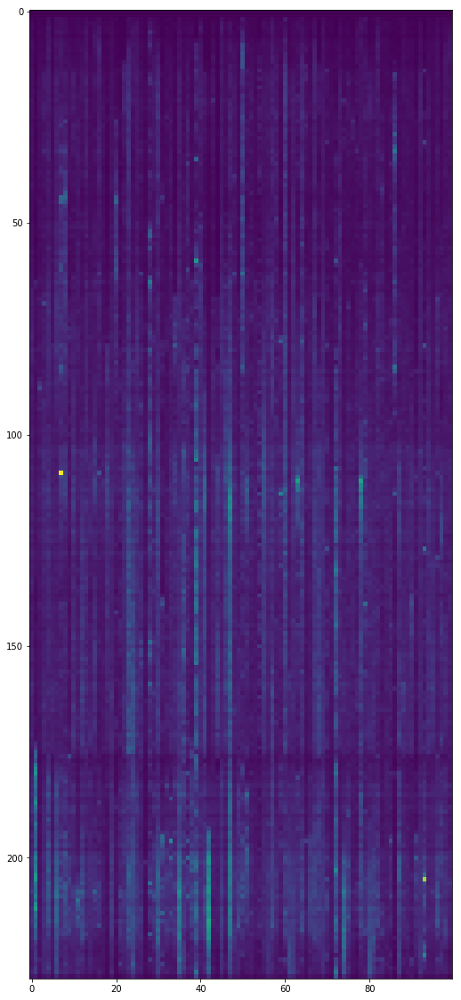

In [62]:
plt.figure(figsize=(10, 20))
plt.imshow(gb[topics]);

## PyGal

PyGal рисует интерактивные svg. В сохранённых ноутбуках этого не видно, но если вы запустите тот же код сами, то можно будет потыкать. Отдельные объекты реагируют на hover, так же можно выделять объекты из легенды.

Можно попробовать как это работает прямо у них в странице с документацией http://www.pygal.org/en/latest/documentation/types/line.html#stacked  

Ещё эта штука работает с flask.

In [63]:
import pygal
from IPython.display import SVG, HTML

In [64]:
# Эта штука нужна только для того, чтобы в ноутбуке рисовалось
html_pygal = """
<!DOCTYPE html>
<html>
  <head>
  <script type="text/javascript" src="http://kozea.github.com/pygal.js/javascripts/svg.jquery.js"></script>
  <script type="text/javascript" src="http://kozea.github.com/pygal.js/javascripts/pygal-tooltips.js"></script>
    <!-- ... -->
  </head>
  <body>
    <figure>
      {pygal_render}
    </figure>
  </body>
</html>
"""

Простой путь: взять и отрисовать как есть

In [67]:
line_chart = pygal.StackedLine(fill=True, show_dots=False)
line_chart.title = 'Topics'
for topic in topics:
    line_chart.add(topic, gb[topic].values)

HTML(html_pygal.format(pygal_render=line_chart.render(is_unicode=True)))

In [68]:
# Так можно посмотреть большую картинку в отдельной вкладке
line_chart.render_in_browser()

file:///tmp/tmpi_bluntn.html


Как мы изначально думали делать шариками не работает при большом количестве тем.

In [69]:
dot_chart = pygal.Dot(x_label_rotation=30)
dot_chart.title = 'Topics'

for topic in topics:
    dot_chart.add(topic, gb[topic].values)

HTML(html_pygal.format(pygal_render=dot_chart.render(is_unicode=True)))

In [78]:
from pygal.style import Style

Если отображать долю, а не абсолютное значение, то становится более читаемо

In [81]:
s = gb[topics].sum(axis=1)
line_chart = pygal.StackedLine(fill=True, show_dots=False,
                               stroke_style={'width': 0.5},
                               style=Style(legend_font_size=6),
                              legend_at_bottom=True)
line_chart.title = 'Topics'
# line_chart.x_labels = map(str, range(2002, 2013))
for topic in topics:
    line_chart.add(topic, gb[topic].values/s)

HTML(html_pygal.format(pygal_render=line_chart.render(is_unicode=True)))

In [82]:
line_chart.render_in_browser()

file:///tmp/tmpdc9okusm.html


Тем слишком много, и в каждый отдельный момент времени важны только несколько. Давайте попробуем их отфильтровать по значимости.  
TODO: придумать более красивый способ это сделать.

In [92]:
gb_filtered = gb.copy()

In [93]:
%%time
gb_filtered[topics] = gb_filtered[topics]\
    .apply(lambda row: row.apply(lambda v: v if v in row.nlargest(10).values else 0), axis=1)

In [94]:
s = gb_filtered[topics].sum(axis=1)
line_chart = pygal.StackedLine(fill=True, show_dots=False,
                               stroke_style={'width': 0.5},
                               style=Style(legend_font_size=6),
                              legend_at_bottom=True)
line_chart.title = 'Topics'
for topic in topics:
    vals = gb_filtered[topic].values/s
    line_chart.add(topic, vals)

HTML(html_pygal.format(pygal_render=line_chart.render(is_unicode=True)))

In [96]:
line_chart.render_in_browser()

file:///tmp/tmpzbfn3qh1.html
